#### I've added comments wherever possible to make the review easy. If you want to get an overview of the whole analysis, please visit the summary section in the end of the notebook. If you've any further questions regarding the analysis, please reach out to me on 'bharadwajsannapaneni@gmail.com'

In [1]:
import collections
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
py.init_notebook_mode()
import cufflinks as cf
import numpy as np
from scipy import stats

# To help you get started...
from IPython.display import display
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from numpy import polyfit
from tslearn.metrics import dtw
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten,MaxPooling2D
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import LSTM
from keras.optimizers import Adam
import collections
from sklearn.metrics import classification_report
import cufflinks as cf
from sklearn.metrics import accuracy_score
from keras.layers import TimeDistributed
from keras.layers import RepeatVector
from math import sqrt
import warnings
warnings.filterwarnings('ignore')
import operator 
from keras.layers import Activation, Dropout

/home/bharadwaj/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

Using TensorFlow backend.


# Load Functions

In [2]:
# Function to load RMS File
def load_rms(uni_num):
    filename = 'data/train/' + 'unit00'+uni_num+'_rms.csv'
    return pd.read_csv(filename, index_col="timestamp")
# Function to load Alarms File
def load_alarms(uni_num):
    filename = 'data/train/' + 'unit00'+uni_num+'_alarms.csv'
    return pd.read_csv(filename, header=None, names=["timestamp", "message"], index_col="timestamp")

# Lets load an RMS file and inspect it

#### Describe its statistcs and plot exploratory plots

Statistics:


,rpm,motor_voltage,motor_current,motor_temp,inlet_temp
count,9.171500e+04,9.171500e+04,9.171500e+04,9.171500e+04,9.171500e+04
mean,-8.111152e+46,-4.431337e+60,-1.387827e+56,-6.640742e+69,-1.937422e+48
std,2.456380e+49,1.903274e+63,4.202968e+58,2.011115e+72,5.867349e+50
min,-7.439020e+51,-5.565298e+65,-1.272847e+61,-6.090557e+74,-1.776896e+53
25%,1.017725e+03,2.311319e+02,3.239347e+01,1.179731e+02,6.489677e+01
50%,1.066347e+03,2.667104e+02,3.944687e+01,1.564521e+02,7.799157e+01
75%,1.106721e+03,2.993994e+02,4.607173e+01,1.978223e+02,9.086132e+01
max,7.978110e+44,1.500194e+65,1.555360e+55,3.117856e+55,1.710299e+40


Histograms:


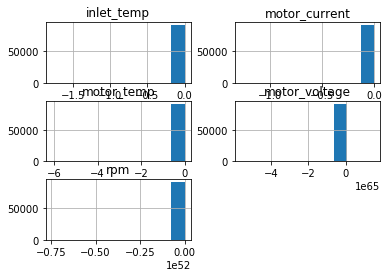

Box Plots:


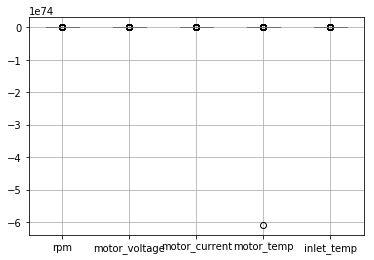

Univariate plots


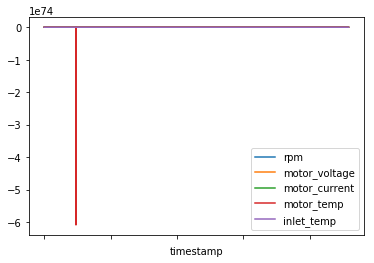

In [3]:
rms00 = load_rms('00')
print("Statistics:")
display(rms00.describe())
print("Histograms:")
ax1 = rms00.hist()
plt.show()
print("Box Plots:")
ax2 = rms00.boxplot()
plt.show()
print("Univariate plots")
ax = rms00.plot()
plt.show()

#### Visualize using plotly for interactiveness

In [4]:
def lineplot(data,yaxis):
    '''
    Takes dataframe and column as input and plots the column using Plotly 
    '''
    trace = go.Scatter(x=data.index,
                         y=data[yaxis])
    layout = go.Layout(title=yaxis+' plot', xaxis=dict(title='Date'),
                   yaxis=dict(title=yaxis))
    fig = go.Figure(data=[trace], layout=layout)
    py.iplot(fig)
    
# Removing because of the memory it adds to the notebook file

#lineplot(rms00,'motor_voltage')

From these exploratory plots we can understand that most of the data is around zero and there are very large(high magnitude) outliers that are affecting the data's mean and standard deviation. We can remove this type of noise using Inter Quartile Range method

# Remove Noise using IQR Method

In [5]:
def remove_noise_using_IQR(data):
    '''
    Takes the noisy data frame as input and outputs the cleaned data frame
    '''
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [6]:
rms00 = remove_noise_using_IQR(rms00)

# Data distribution after removing the noise

Statistics:


,rpm,motor_voltage,motor_current,motor_temp,inlet_temp
count,77757.000000,77757.000000,77757.000000,77757.000000,77757.000000
mean,1075.895625,272.465656,40.490959,163.569767,79.453754
std,52.397865,34.221489,6.608317,39.720310,15.052574
min,884.408166,128.824543,12.038422,29.380739,26.207155
25%,1040.304533,242.221817,34.208892,126.065341,67.755420
50%,1076.184784,276.465551,41.433444,166.680750,80.322508
75%,1111.577604,302.191660,46.629926,200.427241,91.625278
max,1240.159302,351.250008,52.920834,252.302654,129.263875


Histograms:


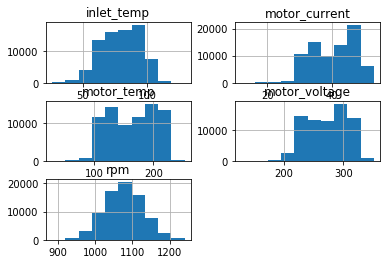

Box Plots:


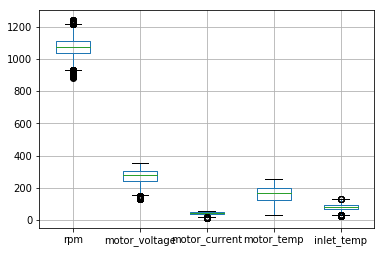

Univariate plots


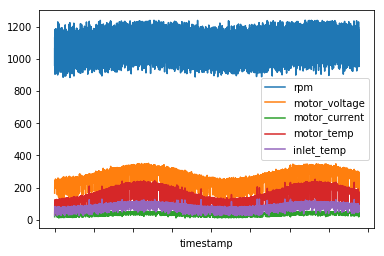

In [7]:
print("Statistics:")
display(rms00.describe())
print("Histograms:")
ax1 = rms00.hist()
plt.show()
print("Box Plots:")
ax2 = rms00.boxplot()
plt.show()
print("Univariate plots")
ax = rms00.plot()
plt.show()

Now the distribution of the data looks reasonable. 

In [8]:
rms00.head(10)

,rpm,motor_voltage,motor_current,motor_temp,inlet_temp
timestamp,,,,,
2003-12-14 04:15:20.899117138,1063.729373,165.879228,19.281104,35.767971,26.387341
2003-12-14 04:45:12.721247385,956.579922,217.484012,25.042943,63.002208,34.350839
2003-12-14 04:55:40.840586778,1063.856934,206.792646,28.782024,69.830473,28.464714
2003-12-14 05:05:37.291038943,1005.212018,219.900341,29.302032,68.019838,39.165607
2003-12-14 05:17:06.465193131,1115.011284,220.373208,30.767473,79.283341,32.983723
2003-12-14 05:25:31.807130176,1028.243351,194.055713,28.676094,75.055177,37.553089
2003-12-14 05:36:24.806079308,1048.012028,222.303513,30.958361,86.875891,39.038291
2003-12-14 05:45:57.604204392,1071.265218,220.091101,29.917097,89.069642,53.178325
2003-12-14 05:57:27.841865348,1121.121953,220.294005,30.317449,91.668490,50.227658


Sensor readings are taken mutiple times every hour, to help preprocessing and for further steps lets take a single reading every hour by taking the mean of all the readings in an hour.

#### Taking the mean of all the readings from a sensor in an hour

In [9]:
def per_hour_conversion(df):
    '''
    Takes the dataframe as input and return the modified dataframe in which there is only reading per hour per sensor
    '''
    
    # Converting the timestamp index to a Pandas timestamp variable
    df['timestamp'] = pd.to_datetime(df.index, errors='coerce')
    
    # Taking the mean of all the values recorded in a day
    df = df.groupby(pd.Grouper(key = 'timestamp',freq = 'h')).mean()
    
    
    
    return df

In [10]:
rms00 = per_hour_conversion(rms00)

In [11]:
rms00.head()

,rpm,motor_voltage,motor_current,motor_temp,inlet_temp
timestamp,,,,,
2003-12-14 04:00:00,1028.055409,196.718629,24.368690,56.200217,29.734298
2003-12-14 05:00:00,1064.810975,216.169647,29.989751,81.662063,42.024449
2003-12-14 06:00:00,1076.460711,222.069806,30.335501,90.671707,45.266477
2003-12-14 07:00:00,1073.116963,219.220754,30.593180,98.175700,47.678018
2003-12-14 08:00:00,1077.161491,219.546912,29.875502,101.261573,49.699977


In [12]:
# Removing because of the memory it adds to the notebook file

# lineplot(rms00,'motor_voltage')

Now there is 1 sensor reading per sensor per hour.

However, from the above line plot and the univariate plots in the top, we can see that there is a clear seasonality in the sensor data. This seasonality can obstruct the actual signal that is responsible for a fault in the unit. So, in the next step I've removed the seasonality by modeling it using a 4th degree polynomial. Degree 4 is chosen by trial and error. 

# Perform Seasonal Adjustment

#### This function models the seasonality of a single attribute and removes it

In [13]:
def seasonal_adjustment(series):
    '''
    Takes a dataframe series and removes it seasonality by subtracting it from a modeled seasonal function
    '''
    orig = series.values
    # fit polynomial: x^2*b1 + x*b2 + ... + bn
    X = [i%(24*365) for i in range(0, len(series))]
    y = series.fillna(method = 'ffill').values
    degree = 4

    coef = polyfit(X, y, degree)

    curve = list()
    for i in range(len(X)):
        value = coef[-1]
        for d in range(degree):
            value += X[i]**(degree-d) * coef[d]
        curve.append(value)
    
    # plot curve over original data
    plt.plot(series.values)
    plt.plot(curve, color='red', linewidth=3)
    plt.ylabel(series.name)
    plt.title('Modeled seasonal function along with the original data')
    plt.show()
    
    # create seasonally adjusted
    values = series.values
    diff = list()
    for i in range(len(values)):
        value = orig[i] - curve[i]
        diff.append(value)
    
    plt.plot(diff)
    plt.title("Signal after removing seasonality")
    plt.ylabel(series.name)
    plt.show()
    
    return diff

#### Function to remove seasonality from the whole dataframe

In [14]:
min_max_scaler = preprocessing.MinMaxScaler()
def remove_seasonality(df):
    '''
    Takes a dataframe as input and removes seasonality from all of its series
    '''
    # Normalize the data before removing seasonality
    df = pd.DataFrame(min_max_scaler.fit_transform(df),columns = df.columns,index = df.index)
    
    for column in df:
        df[column] = seasonal_adjustment(df[column])
    return df

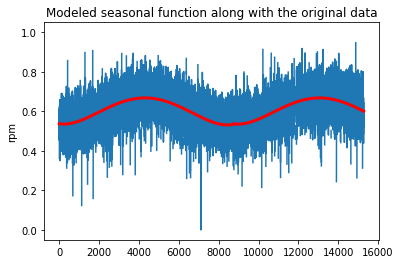

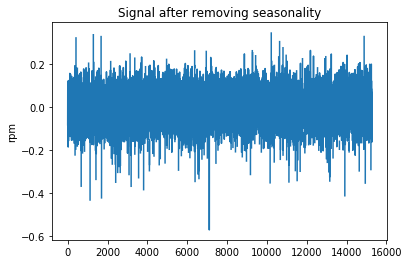

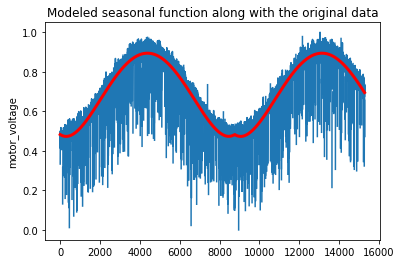

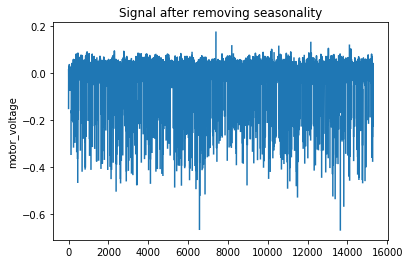

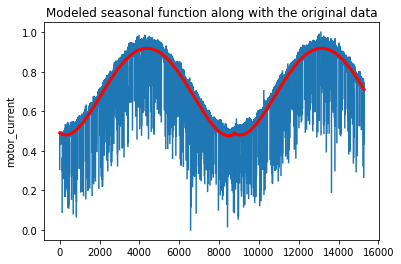

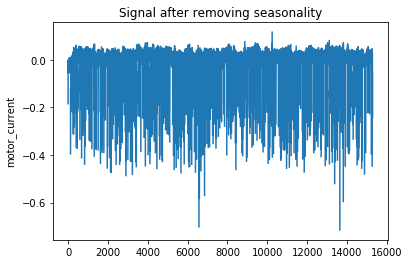

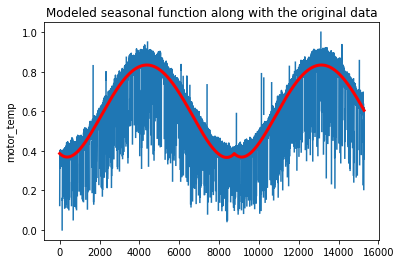

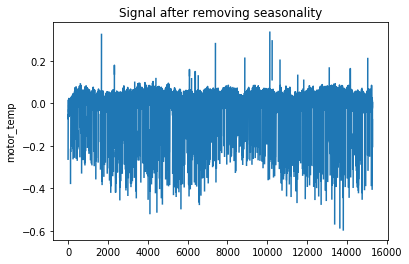

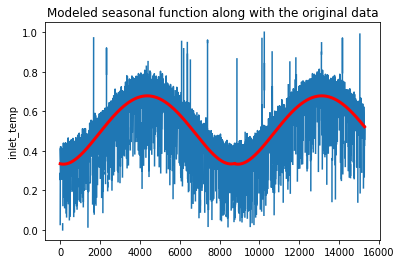

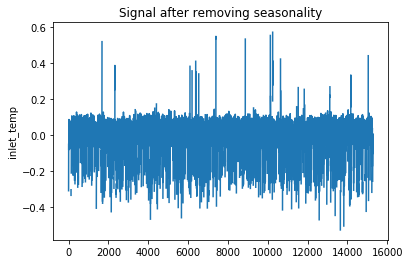

In [15]:
rms00 = remove_seasonality(rms00)

In [ ]:
# lineplot(rms00,'motor_voltage')

Now the rms data seems to have just the desired sensor signal

# Lets load the alarms data and inspect it

,message
count,305
unique,2
top,warning
freq,304


,message
timestamp,
2003-12-15 19:18:56.526325850,warning
2003-12-15 23:29:11.344610850,warning
2003-12-17 16:26:26.782823329,warning
2003-12-18 02:21:51.445540122,warning
2004-01-04 17:16:12.501831699,warning


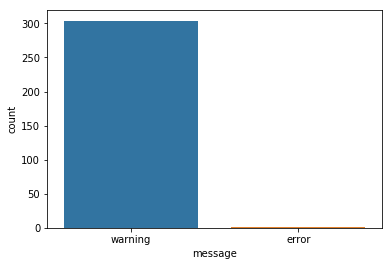

,message
timestamp,
2005-07-04 22:17:18.100154343,error


Unit failed on 2005-09-10 17:00:00


In [17]:
alarms00 = load_alarms('00')

display(alarms00.describe())

display(alarms00.head())

ax = sns.countplot(alarms00['message'])
plt.show()

display(alarms00[alarms00['message'] == 'error'])

print("Unit failed on",max(rms00.index))

There are about 304 warnings and 1 error. The error is on July 4th, 2005 and the unit failed on September 10, 2005. [Not sure if the error is a right indicator of fault]

### Lets also convert alarms data hourly, by converting the message variable to frequency of warnings and errors, and merge alarms data with rms data

In [18]:
def per_hour_conversions_alarms(df):
    '''
    Takes the alarms dataframe and returns a dataframe with frequency of warnings and errors per hour
    '''
    # Converting the timestamp index to a Pandas timestamp variable
    df['timestamp'] = pd.to_datetime(df.index, errors='coerce')
    
    df = pd.get_dummies(df)
    # Taking the count of all the values recorded in an hour
    df = df.groupby(pd.Grouper(key = 'timestamp',freq = 'h')).sum()

    return df

In [19]:
alarms00 = per_hour_conversions_alarms(alarms00)

df = rms00.join(alarms00)

# If there are no warnings in the data then instead of having nans replace it with 0s
df['message_error'].fillna(value = 0,inplace = True)
df['message_warning'].fillna(value = 0,inplace = True)

# If there are missing values in the sensor data at any hour, filling that 'nan' with the previous value makes sense
# because assuming that the current sensor value would be same as previous hour's value is a reasonable assumption
df.fillna(method = 'ffill',inplace = True)

#### As our objective is to understand the fault. Lets create a variable that shows number of hours to the unit failure

In [20]:
def add_n_hrs_to_failure(df):
    '''
    Takes a dataframe that is preprocessed as mentioned above and adds the 'number of hours to the failure' attribute
    '''
    df['time'] = pd.to_datetime(df.index, errors='coerce')
    
    failed_time_stamp = max(df.time)
    df['n_hrs_to_failure'] = (failed_time_stamp - df.time).astype('timedelta64[h]')
    
    df.drop(['time'],axis = 1,inplace = True)
    return df

df = add_n_hrs_to_failure(df)

#### Pair plots of the data

Lets observe the relationship between variables and their distributions

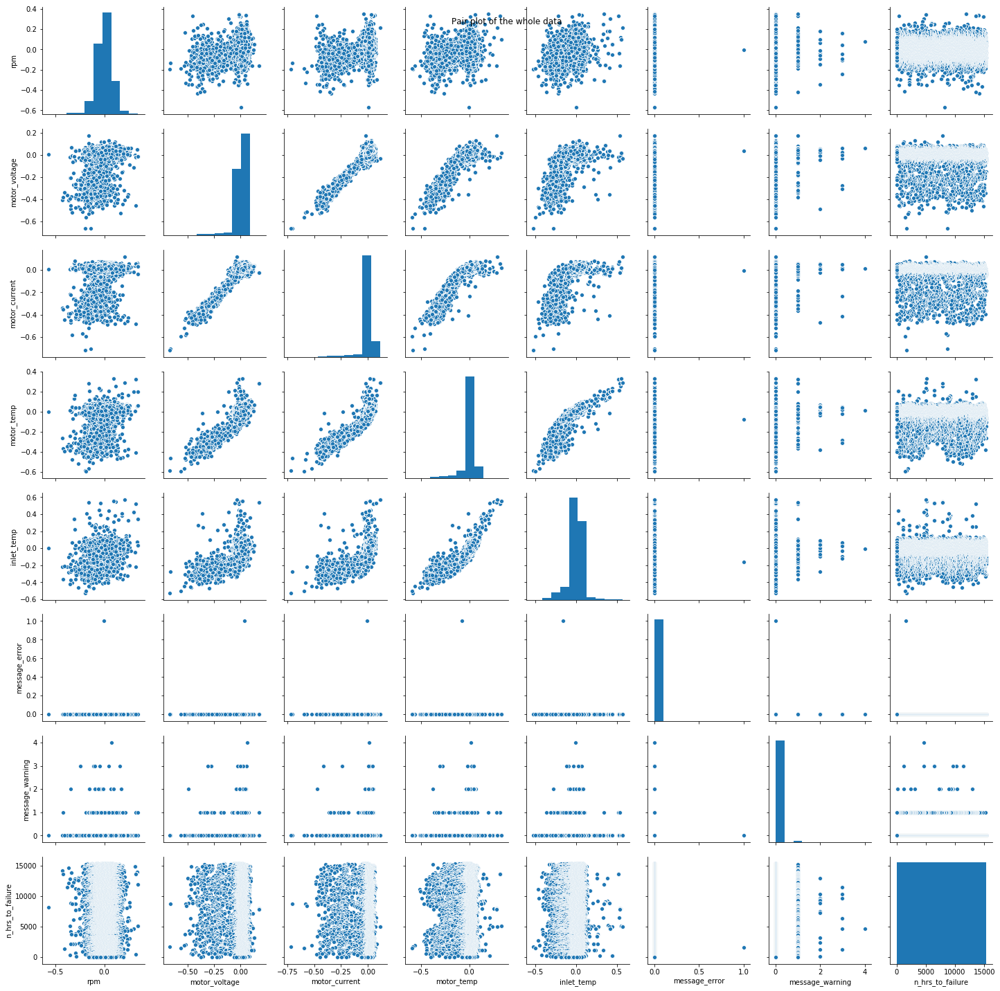

In [21]:
ax = sns.pairplot(df)
ax.fig.suptitle("Pair plot of the whole data")
plt.show()

All the pair plots seems to be normal. Interesting ones are 'motor_current vs motor_temp' where the motor_temp is linear with motor_curr in the beginning, but after a particular cut off, the temperature grows parallel to y axis. The similar relationship can be observed in few other pair plots as well.[motor current vs inlet temp, motor voltage vs inlet temp, motor voltage vs motor temp]

The variable that we're interested in 'n_hrs_to_failure' hasn't shown any particular trends. It seems constant wrt sensor readings. However in the second plot, we can see that there are few unusual minimum values in the motor_temp, motor_current, motor_voltage. Also motor_temp and inlet_temp seems interesting.

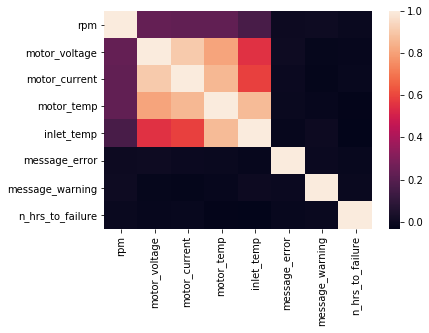

In [22]:
corr = df.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.show()

Correlation plot is also showing expected trends. Motor Voltage, Motor Current, Motor Temperature and Inlet Temperature are correlated. The variable 'number of hours to failure' is not correlated with any other variable.

# Lets put all these preprocessing functions together and apply them for the whole data

In [23]:
def preprocess(uni_num):
    '''
    This function takes the unit number as input and performs all the preprocessing steps mentioned above. 
    Returns completely preprocessed dataframe
    '''
    # Load Data from the given Unit Number
    df = load_rms(uni_num = uni_num)
        
    # Remove Noise
    df = remove_noise_using_IQR(df)

    # Convert the Data into required format
    df = per_hour_conversion(df)
    
    # Remove Seasonality 
    df = remove_seasonality(df)
    
    # Load Alarms Data
    alarms = load_alarms(uni_num = uni_num)
    
    # Count number of warnings and errors per hour and make it as a dataframe
    alarms = per_hour_conversions_alarms(alarms)
    
    # Join Alarms data with RMS data
    df = df.join(alarms)
    
    # Fill Missing values in the alarms attributes with zero
    if 'message_error' in df.columns:
        df['message_error'].fillna(value = 0,inplace = True)
    else:
        df['message_error'] = 0
    
    if 'message_warning' in df.columns:
        df['message_warning'].fillna(value = 0,inplace = True)
    else:
        df['message_warning'] = 0
    # Fill nans in sensor data with forward filling
    df.fillna(method = 'ffill',inplace = True)
    
    # Normalize the data
    min_max_scaler = preprocessing.MinMaxScaler()
    df = pd.DataFrame(min_max_scaler.fit_transform(df),columns = df.columns,index = df.index)
    
    # Add number of days to the failure label
    df = add_n_hrs_to_failure(df)
    
    return df

#### Reading the data from all training units and merging them to 'rms' dataframe

In [24]:
# Preprocessing and Combining all the available training data
rms = preprocess('00')
rms['uni_num'] = '00'
for i in range(1,18):
    uni_num = str(i).zfill(2)
    df = preprocess(uni_num)
    df['uni_num'] = uni_num
    rms = pd.concat([rms,df],sort = True)

#### As we're interested in predicting the fault in an Unit. Lets add a status label, such that if the n_hrs_to_failure is less than 36 hrs then the status is 1 (Approaching or approached Fault), otherwise status is 0(Normal condition)

In [25]:
def add_status(df):
    '''
    This function adds status variable to the rms dataframe
    '''
    if(df['n_hrs_to_failure'] < 36):
        return 1
    else:
        return 0

##### Completely preprocessed data

In [26]:
rms['status'] = rms.apply(add_status,axis = 1)
rms.head(10)

,inlet_temp,message_error,message_warning,motor_current,motor_temp,motor_voltage,n_hrs_to_failure,rpm,uni_num,status
timestamp,,,,,,,,,,
2003-12-14 04:00:00,0.198286,0.0,0.0,0.638217,0.357786,0.614662,15277.0,0.531675,00,0
2003-12-14 05:00:00,0.310300,0.0,0.0,0.812711,0.484246,0.728424,15276.0,0.661254,00,0
2003-12-14 06:00:00,0.339866,0.0,0.0,0.823525,0.529062,0.762987,15275.0,0.702337,00,0
2003-12-14 07:00:00,0.361864,0.0,0.0,0.831605,0.566407,0.746415,15274.0,0.690567,00,0
2003-12-14 08:00:00,0.380312,0.0,0.0,0.809421,0.581826,0.748400,15273.0,0.704841,00,0
2003-12-14 09:00:00,0.383321,0.0,0.0,0.812412,0.562956,0.814076,15272.0,0.589473,00,0
2003-12-14 10:00:00,0.436568,0.0,0.0,0.807050,0.583278,0.757913,15271.0,0.629991,00,0
2003-12-14 11:00:00,0.404681,0.0,0.0,0.829918,0.561141,0.786109,15270.0,0.688265,00,0
2003-12-14 12:00:00,0.427877,0.0,0.0,0.814745,0.582777,0.766191,15269.0,0.534165,00,0


# -------------------------------------------------------------------------------------------------------------

# Analyzing the data as independent instances (To see if we can just use the current instances to classify the status)

#### Preparing the data for classifiers

In [29]:
# Splitting Train and Test based on index.
# Chose only few variables for classification. Using all the variables is giving bad performance on the validation
# data
X_train = rms[['inlet_temp', 'motor_current',
       'motor_temp', 'motor_voltage']].iloc[:100000]
y_train = rms['status'].iloc[:100000]
X_test = rms[['inlet_temp', 'motor_current',
       'motor_temp', 'motor_voltage']].iloc[100000:]
y_test = rms['status'].iloc[100000:]

#### Random Forest Classifier

In [30]:
from sklearn.ensemble import RandomForestClassifier
RF_clf = RandomForestClassifier(class_weight = 'balanced')
RF_clf.fit(X_train,y_train)

y_pred_RF = RF_clf.predict(X_test)

print("\n \n Random Forest Outputs")
print("Accuracy is ", accuracy_score(y_test,y_pred_RF)*100)
print("Confusion Matrix is \n ",confusion_matrix(y_test,y_pred_RF))
print("\n\n",classification_report(y_test,y_pred_RF))


 
 Random Forest Outputs
Accuracy is  99.40000827574792
Confusion Matrix is 
  [[48044     2]
 [  288     0]]


               precision    recall  f1-score   support

           0       0.99      1.00      1.00     48046
           1       0.00      0.00      0.00       288

    accuracy                           0.99     48334
   macro avg       0.50      0.50      0.50     48334
weighted avg       0.99      0.99      0.99     48334



Result from RF model is not desirable as the classifier hasn't identified any True Faults

#### Using Light GBM classifier

In [31]:
from lightgbm import LGBMClassifier
lgbm_clf = LGBMClassifier(class_weight = 'balanced')
lgbm_clf.fit(X_train,y_train)

y_pred_lgbm = lgbm_clf.predict(X_test)

print("\n \n Light GBM Outputs")
print("Accuracy is ", accuracy_score(y_test,y_pred_lgbm)*100)
print("Confusion Matrix is \n ",confusion_matrix(y_test,y_pred_lgbm))
print("\n\n",classification_report(y_test,y_pred_lgbm))


 
 Light GBM Outputs
Accuracy is  92.59941242189763
Confusion Matrix is 
  [[44707  3339]
 [  238    50]]


               precision    recall  f1-score   support

           0       0.99      0.93      0.96     48046
           1       0.01      0.17      0.03       288

    accuracy                           0.93     48334
   macro avg       0.50      0.55      0.49     48334
weighted avg       0.99      0.93      0.96     48334



In [32]:
Imp_Feat = pd.DataFrame(RF_clf.feature_importances_,columns = ['RF_Imp_Fea'],index = X_train.columns)
Imp_Feat['Lgbm_Imp_Fea'] = lgbm_clf.feature_importances_
Imp_Feat

,RF_Imp_Fea,Lgbm_Imp_Fea
inlet_temp,0.266676,712
motor_current,0.249398,801
motor_temp,0.243285,809
motor_voltage,0.240641,678


Results from LGBM are bad, but are better compared to the RF model.

# -------------------------------------------------------------------------------------------------------------

# Analyzing the data as a time series

#### Segmenting the data for time series analysis

To perform time series analysis on this dataset, lets segment the data into sequences of 30 hours. We can also have the 30th timestamp 'status' label as the label for the sequence. This way we can see if there is any information in the sequence that is related to the 'status' of the unit. 30 hours sequences are chosen by trial and error.

In [33]:
def generate_seq(X,y,df,seq_len = 30):
    '''
    This function creates time series sequences of input features from given dataframe 'df'
    Each sequence is of length 30 and has 7 features. (30 x 7)
    '''
    for i in range(seq_len,len(df)):
        X.append(df.iloc[i-seq_len:i][['inlet_temp','motor_current','motor_temp','motor_voltage','rpm','message_error','message_warning']].values)
        y.append(df.iloc[i]['status'])
            
    return X,y

def generate(rms):
    '''
    This function divides the dataframes into units and pass those dataframes to 'generate_seq' function, so it 
    can generate time series sequences of size 30x7 from the whole available data
    '''
    X = []
    y = []
    for uni_num in rms['uni_num'].unique():
        X,y = generate_seq(X,y,rms[rms['uni_num'] == uni_num])
    return X,y
        

In [34]:
X,y = generate(rms)

X = np.array(X)
y = np.array(y)

In [35]:
print(X.shape)
print(y.shape)

(147794, 30, 7)
(147794,)


#### Dimensionality reduction techniques to visualize the data (Performed Multi Dimensional Scaling and t-SNE)

As the data is time series, using Dynamic Time Warping(DTW) as a distance metric to calculate the distance between two time series instances makes more sense, however DTW has very high time complexity O(MN), so it takes lot of time to perform MDS on the whole data. To understand the structure of the data and to reduce running time, I've subsampled the data. During subsampling, I've only discarded the instances where status == 0, because there are very few status 1 instances

#### Subsampling and preparing the data

In [36]:
X_1 = X[np.where(y == 1)]
y_1 = np.array([1]*len(X_1))

X_0 = X[np.where(y == 0)]

# Randomly sample from X_0 and y_0
idx = np.random.randint(len(X_0), size=len(y_1))
X_0 = X_0[idx,:]
y_0 = np.array([0]*len(X_0))

X_s = np.concatenate((X_1,X_0),axis = 0)
y_s = np.concatenate((y_1,y_0),axis = 0)

print(X_s.shape)
print(y_s.shape)

(1296, 30, 7)
(1296,)


#### Calculate Distance matrix using DTW [It is used for MDS, t-SNE and DBSCAN]

In [37]:
def calculate_DTW_distance_matrix(X):
    '''
    This function calculates the Dynamic Time Warping distance between the time sequences and calculates a DTW
    distance matrix.
    '''
    distance_matrix = [[0 for i in range(len(X))] for j in range(len(X))]
    for i in range(len(distance_matrix)):
        for j in range(i+1,len(distance_matrix)):
            dist = dtw(X[i],X[j])
            distance_matrix[i][j] = dist
            distance_matrix[j][i] = dist
    return distance_matrix

In [38]:
# This still takes lot of time (Around 5 minutes on a workstation)
distance_matrix = calculate_DTW_distance_matrix(X_s)
distance_matrix = pd.DataFrame(distance_matrix)
distance_matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,1286,1287,1288,1289,1290,1291,1292,1293,1294,1295
0,0.000000,0.272428,0.361562,0.357695,0.409998,0.454235,0.522245,0.470680,0.498929,1.586954,...,1.080987,0.954234,1.200100,1.057636,1.595987,1.157985,1.311178,0.862900,2.142732,0.916995
1,0.272428,0.000000,0.117826,0.130281,0.196524,0.230541,0.325697,0.353757,0.365353,1.521825,...,1.054380,0.958846,1.233952,1.025682,1.597128,1.143139,1.313187,0.757066,2.101607,0.812205
2,0.361562,0.117826,0.000000,0.111016,0.169277,0.206549,0.269608,0.331958,0.337036,1.482427,...,1.014600,0.961792,1.233423,1.010816,1.600603,1.133975,1.316966,0.733151,2.059830,0.776554
3,0.357695,0.130281,0.111016,0.000000,0.081903,0.178876,0.269441,0.286817,0.293809,1.477728,...,1.008208,0.963393,1.316085,0.989498,1.602190,1.136243,1.326293,0.733379,2.038939,0.775816
4,0.409998,0.196524,0.169277,0.081903,0.000000,0.146657,0.230824,0.251153,0.257836,1.465163,...,0.998664,0.959155,1.319887,0.989362,1.602587,1.142768,1.334801,0.727956,2.052094,0.780448


#### Perform Multi Dimensional Scaling using the DTW matrix calculated above

In [142]:
embedding = MDS(n_components=2,dissimilarity='precomputed')
X_transformed = embedding.fit_transform(distance_matrix)
print(X_transformed.shape)

(1296, 2)


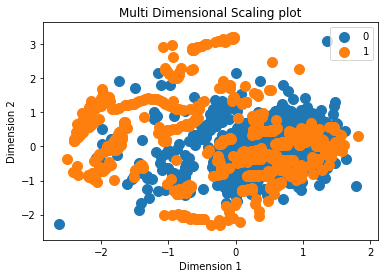

In [143]:
scatter_x = X_transformed[:,0]
scatter_y = X_transformed[:,1]
group = y_s

fig, ax = plt.subplots()
for g in np.unique(group):
    ix = np.where(group == g)
    ax.scatter(scatter_x[ix], scatter_y[ix], label = g, s = 100)
ax.legend()
plt.title('Multi Dimensional Scaling plot')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [144]:
print("Number of 0 instances",len(y_0))
print("Number of 1 instances",len(y_1))

Number of 0 instances 648
Number of 1 instances 648


### Lets see if t-SNE shows any clusters

In [145]:
X_embedded = TSNE(n_components=2,metric = 'precomputed').fit_transform(distance_matrix)

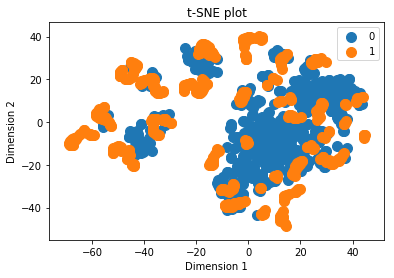

In [146]:
scatter_x = X_embedded[:,0]
scatter_y = X_embedded[:,1]
group = y_s

fig, ax = plt.subplots()
for g in np.unique(group):
    ix = np.where(group == g)
    ax.scatter(scatter_x[ix], scatter_y[ix], label = g, s = 100)
ax.legend()
plt.title('t-SNE plot')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

From the dimensionality reduction techniques it seems that there is no one particular boundary that can separate class 0 from class 1. However, there are clusters in the data

# Clustering

As we can see from Multi Dimensional Scaling plot, the clusters have different densities and the data distribution is not spherical. So, using k-means or heirarchical clustering techniques is not a good choice. DBSCAN is preferable for this kind of data

In [168]:
clustering = DBSCAN(eps=0.12, min_samples=4,metric = "precomputed").fit(distance_matrix)

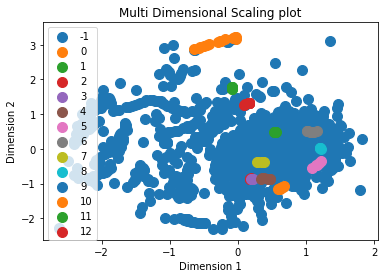

In [169]:
import matplotlib.cm as cm

scatter_x = X_transformed[:,0]
scatter_y = X_transformed[:,1]
group = clustering.labels_

fig, ax = plt.subplots()
for g in np.unique(group):
    ix = np.where(group == g)
    ax.scatter(scatter_x[ix], scatter_y[ix], label = g, s = 100)
ax.legend()
plt.title('Multi Dimensional Scaling plot')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

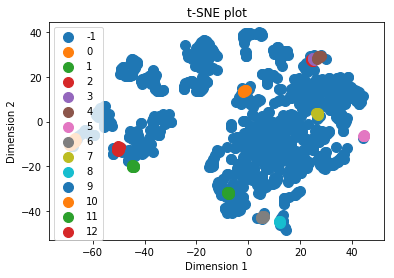

In [170]:
scatter_x = X_embedded[:,0]
scatter_y = X_embedded[:,1]
group = clustering.labels_

fig, ax = plt.subplots()
for g in np.unique(group):
    ix = np.where(group == g)
    ax.scatter(scatter_x[ix], scatter_y[ix], label = g, s = 100)
ax.legend()
plt.title('t-SNE plot')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

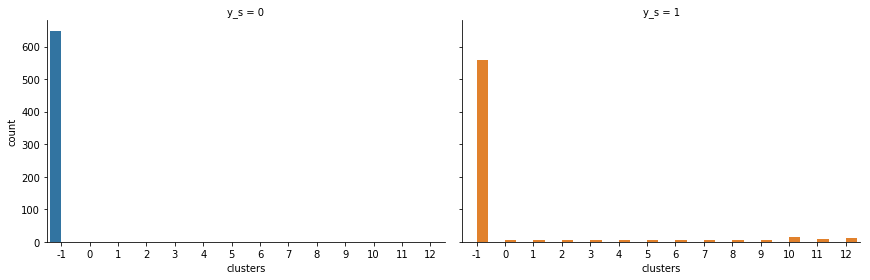

In [171]:
y_s_df = pd.DataFrame(clustering.labels_,columns = ["clusters"])
y_s_df['y_s'] = y_s
g = sns.catplot(x="clusters", hue="y_s", col="y_s",data=y_s_df, kind="count",height=4, aspect=1.5);

Above MDS and t-SNE plots colored with clusters shows that there are no seperate clusters of data. However class 1 is clustered into various clusters,and class 0 is all unclustered(-1). We can say that although class0 data and class 1 data is not separated by distance, all the class 1 is densely populated based on few features

# Forecasting the sensor values using LSTM

### Data Preparation

Using past 30 sensor values to predict the future 10 values

In [386]:
def generate_seq_reg(X,y,df,seq_len = 30,pred_seq_len = 10):
    '''
    This function creates the input time series sequences of shape (30,7) and output time series sequences of
    shape (10,7)
    '''
    for i in range(seq_len,len(df)-pred_seq_len):
        X.append(df.iloc[i-seq_len:i][['inlet_temp','motor_current','motor_temp','motor_voltage','rpm','message_error','message_warning']].values)
        y.append(df.iloc[i:i+pred_seq_len][['inlet_temp','motor_current','motor_temp','motor_voltage','rpm','message_error','message_warning']].values)
            
    return X,y

def generate_reg(rms):
    '''
    This function separates the data from each unit and creates time series sequences using generate_seq_reg 
    function
    '''
    X = []
    y = []
    for uni_num in rms['uni_num'].unique():
        X,y = generate_seq_reg(X,y,rms[rms['uni_num'] == uni_num])
    return X,y

In [387]:
X_train,y_train = generate_reg(rms)

In [388]:
X_train,y_train = np.array(X_train),np.array(y_train)
print(X_train.shape,y_train.shape)

(147614, 30, 7) (147614, 10, 7)


Unit 18 data which is not used for training is used for validation

In [391]:
val_dat = preprocess('18')

val_dat['uni_num'] = '18'
val_dat['status'] = val_dat.apply(add_status,axis = 1)


X_val,y_val = generate_reg(val_dat)

X_val = np.array(X_val)
y_val = np.array(y_val)

print(X_val.shape,y_val.shape)

(12490, 30, 7) (12490, 10, 7)


In [392]:
n_steps_out = 10
n_features = 7
n_steps_in = 30
# define model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(n_steps_in, n_features)))
model.add(RepeatVector(n_steps_out))
model.add(LSTM(200, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(n_features)))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(X_train, y_train, epochs=5, batch_size=128, validation_data=(X_val,y_val))

Train on 147614 samples, validate on 12490 samples
Epoch 1/5
147614/147614 [==============================] - 254s 2ms/step - loss: 0.0089 - val_loss: 0.0068
Epoch 2/5
147614/147614 [==============================] - 238s 2ms/step - loss: 0.0055 - val_loss: 0.0065
Epoch 3/5
147614/147614 [==============================] - 236s 2ms/step - loss: 0.0053 - val_loss: 0.0067
Epoch 4/5
147614/147614 [==============================] - 238s 2ms/step - loss: 0.0052 - val_loss: 0.0063
Epoch 5/5
147614/147614 [==============================] - 236s 2ms/step - loss: 0.0051 - val_loss: 0.0062


## Prediction on test data

Unit 19 data is kept separately for testing. 

In [402]:
test_dat = preprocess('19')

test_dat['uni_num'] = '19'
test_dat['status'] = val_dat.apply(add_status,axis = 1)


X_test,y_test = generate_reg(test_dat)

X_test = np.array(X_test)
y_test = np.array(y_test)

print(X_test.shape,y_test.shape)

(4016, 30, 7) (4016, 10, 7)


In [394]:
y_pred = model.predict(X_test)

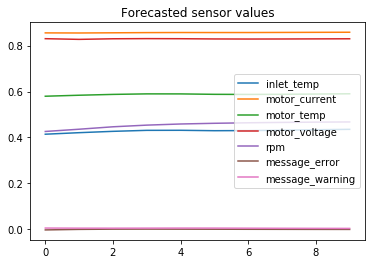

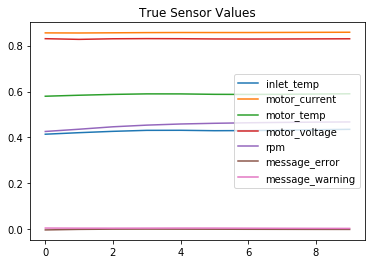

In [395]:
y_pred_df = pd.DataFrame(y_pred[10],columns = ['inlet_temp','motor_current','motor_temp','motor_voltage','rpm','message_error','message_warning'])
y_pred_df.plot()
plt.title('Forecasted sensor values')
y_test_df = pd.DataFrame(y_pred[10],columns = y_pred_df.columns)
y_test_df.plot()
plt.title('True Sensor Values')
plt.show()

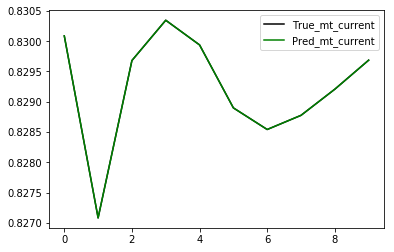

In [396]:
ax = plt.plot(y_pred_df['motor_voltage'],color = 'k',label = 'True_mt_current')
ax = plt.plot(y_test_df['motor_voltage'],color = 'g',label = 'Pred_mt_current')
plt.legend()
plt.show()

#### Evaluating Forecasts

In [397]:
def evaluate_forecasts(y_test, y_pred):
    '''
    This function calculates the individual MSE scores for each sequence prediction and the total RMSE of the model
    '''
    # Calculating MSE for each forecast
    scores = []
    for i in range(len(y_test)):
        scores.append(mean_squared_error(y_test[i],y_pred[i]))
    
    # Calculating MSE for all the forecasts
    s = 0
    for i in range(y_test.shape[0]):
        for j in range(y_test.shape[1]):
            for k in range(y_test.shape[2]):
                s += (y_test[i,j,k] - y_pred[i,j,k])**2
    score = sqrt(s/(y_test.shape[0]*y_test.shape[1]*y_test.shape[2]))
    
    return score,scores

In [403]:
score,scores = evaluate_forecasts(y_test,y_pred)

In [405]:
print("Root Mean Squared Error of the prediction is",score)

Root Mean Squared Error of the prediction is 0.07736028823953758


# Question 2

## Predicting the fault

From the MDS and t-SNE plots we can see that there is no specific boundary between Class 0 and Class 1, but some of them are clustered together. So KNN might be a good choice of classification algorithm

Using DTW as distance metric and using KNN as classification algorithm to classify the time series into Class 0(Non-fault), Class 1 (Fault) sequence. KNN will have very high time complexity, because we're using DTW which has a time complexity of O(MN) and KNN itself has a time complexity of O(ndk). So total complexity will be O(nMNk). So I'm using very few samples to test if the algorithm works for this classification

# Using KNN

### Data Preparation

In [87]:
print(X.shape)
print(y.shape)

(147794, 30, 7)
(147794,)


#### Undersampling (To balance dataset and to give less load to KNN)

In [88]:
def undersample(X,y,ratio = 1):
    '''
    This function takes total available input sequences and randomly subsample the class 0 instances equal to 
    class 1 instances
    '''
    X_1 = X[np.where(y == 1)]
    y_1 = np.array([1]*len(X_1))

    X_0 = X[np.where(y == 0)]

    # Randomly sample from X_0 and y_0
    idx = np.random.randint(len(X_0), size=(int(ratio*len(y_1))))
    X_0 = X_0[idx,:]
    y_0 = np.array([0]*len(X_0))

    X_s = np.concatenate((X_1,X_0),axis = 0)
    y_s = np.concatenate((y_1,y_0),axis = 0)
    
    return X_s,y_s

In [89]:
X_s,y_s = undersample(X,y,1)
print(X_s.shape,y_s.shape)
print(collections.Counter(y_s))

(1296, 30, 7) (1296,)
Counter({1: 648, 0: 648})


In [93]:
val_dat = preprocess('18')

val_dat['uni_num'] = '18'
val_dat['status'] = val_dat.apply(add_status,axis = 1)


X_val,y_val = generate(val_dat)

X_val = np.array(X_val)
y_val = np.array(y_val)

print(X_val.shape,y_val.shape)

(12500, 30, 7) (12500,)


In [94]:
X_val_s,y_val_s = undersample(X_val,y_val,1)
print(X_val_s.shape,y_val_s.shape)
print(collections.Counter(y_val_s))

(72, 30, 7) (72,)
Counter({1: 36, 0: 36})


### KNN algorithm (using Dynamic Time Warping as the distance metric)

In [411]:
def getNeighbors(trainingSet, testInstance, k):
    '''
    This function calculates k closest neighbors of the test instance that are in training set and returns their
    indices
    '''
    distances = []
    length = len(testInstance)-1
    for x in range(len(trainingSet)):
        dist = dtw(testInstance, trainingSet[x], length)
        distances.append((x, dist))
    distances.sort(key=operator.itemgetter(1))
    neighbors = []
    for x in range(k):
        neighbors.append(distances[x][0])
    return neighbors

In [412]:
def getResponse(neighbors,y_train):
    '''
    This function takes the k closest neighbors as input and returns the class with highest number of votes
    '''
    #print(neighbors)
    classVotes = {}
    for x in range(len(neighbors)):
        response = y_train[neighbors[x]]
        #print(response)
        if response in classVotes:
            classVotes[response] += 1
        else:
            classVotes[response] = 1
    #print(classVotes)
    sortedVotes = sorted(classVotes.items(), key=operator.itemgetter(1), reverse=True)
    return sortedVotes[0][0]

In [413]:
def knn_classifier(X_train,y_train,X_test,k):
    '''
    This function combines the getNeighbors and getResponse functions and function as a complete KNN classifier
    It takes training data and testing data as input and outputs the labels for test data
    '''
    pred = []
    for instance in X_test:
        neighbors = getNeighbors(X_train, instance, k)
        response = getResponse(neighbors,y_train)
        pred.append(response)
    return pred

In [428]:
y_pred = knn_classifier(X_s,y_s,X_val_s,2)

In [429]:
print(classification_report(y_val_s, y_pred))
confusion_matrix(y_val_s, y_pred)

              precision    recall  f1-score   support

           0       0.50      0.92      0.65        36
           1       0.50      0.08      0.14        36

   micro avg       0.50      0.50      0.50        72
   macro avg       0.50      0.50      0.39        72
weighted avg       0.50      0.50      0.39        72



array([[33,  3],
       [33,  3]])

# Using LSTM for classification(using full X and y data)

As the data is highly unbiased we can add weight for the class 1

In [632]:
cnt = collections.Counter(y)
print(cnt[0]/cnt[1])
class_weight = {0: 1.,
                1: 227.}

227.07716049382717


Model hyper parameters like number of layers, number of units etc., are selected using Cross validation method.

In [635]:
LSTMmodel = Sequential()
LSTMmodel.add(LSTM(64, input_shape=(30, 7),return_sequences = True))
LSTMmodel.add(Dropout(0.5))
LSTMmodel.add(LSTM(64, input_shape=(30, 7),return_sequences = True))
LSTMmodel.add(Dropout(0.5))
LSTMmodel.add(LSTM(64, input_shape=(30, 7),return_sequences = True))
LSTMmodel.add(Dropout(0.5))
LSTMmodel.add(LSTM(32))
LSTMmodel.add(Dropout(0.5))
LSTMmodel.add(Dense(1,activation = 'sigmoid'))

LSTMmodel.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
LSTMmodel.fit(X, y, epochs=5, validation_data=(X_val,y_val), class_weight=class_weight)

Train on 147794 samples, validate on 12500 samples
Epoch 1/5
147794/147794 [==============================] - 275s 2ms/step - loss: 1.3231 - acc: 0.6896 - val_loss: 0.6625 - val_acc: 0.9504
Epoch 2/5
147794/147794 [==============================] - 267s 2ms/step - loss: 1.3040 - acc: 0.7002 - val_loss: 0.5090 - val_acc: 0.9971
Epoch 3/5
147794/147794 [==============================] - 274s 2ms/step - loss: 1.3042 - acc: 0.7028 - val_loss: 0.6428 - val_acc: 0.9971
Epoch 4/5
147794/147794 [==============================] - 276s 2ms/step - loss: 1.3256 - acc: 0.7406 - val_loss: 0.6165 - val_acc: 0.9971
Epoch 5/5
147794/147794 [==============================] - 274s 2ms/step - loss: 1.3216 - acc: 0.6344 - val_loss: 0.6544 - val_acc: 0.9971


In [636]:
y_pred_val = np.round(LSTMmodel.predict(X_val))
print(classification_report(y_val, y_pred_val))
confusion_matrix(y_val, y_pred_val)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12464
           1       0.00      0.00      0.00        36

   micro avg       1.00      1.00      1.00     12500
   macro avg       0.50      0.50      0.50     12500
weighted avg       0.99      1.00      1.00     12500



array([[12464,     0],
       [   36,     0]])

# Classification using CNN

To perform classification of this time series data, I've chosen Convolutional Neural Network(CNN). CNN is proven to work well on a noisy time series data.

#### Preparing data for CNN

I've used recurrence plots to convert time series data as an image. This kind of plots are generally used while analyzing audio signals. Each time series of size 'N' will be converted into an image of size NxN, and each feature will be added as 'Channel' to the image.

In [83]:
#modified from https://stackoverflow.com/questions/33650371/recurrence-plot-in-python

# This function converts a time series of size N into an image of size NxN
def rec_plot(s, eps=None, steps=None):
    '''
    This function takes a single feature time series as input and converts it into a image using rec plot, 
    and returns it.
    '''
    if eps==None: eps=0.01
    if steps==None: steps=10
    N = s.size
    S = np.repeat(s[None,:], N, axis=0)
    Z = np.floor(np.abs(S-S.T)/eps)
    Z[Z>steps] = steps
 
    return Z

In [84]:
# This function converts the whole Multivariate time series as an image of dimension fxNxN, 
# where f is the number of features
def create_image(MV_TS):
    '''
    This function takes multivariate time series data and converts it into images
    '''
    output = []
    #print(len(MV_TS[0]))
    for i in range(len(MV_TS[0])):
        curr = rec_plot(MV_TS[:,i])
        #plt.imshow(curr)
        output.append(curr)
    return output

#### Sample images from rec_plot

In [85]:
sample = np.array(create_image(X[0]))
sample.shape

(7, 30, 30)

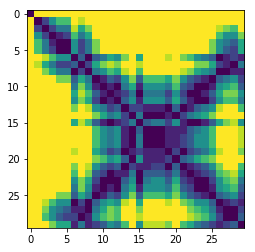

In [86]:
plt.imshow(sample[0])

#### Convert Train, Val, Test data as  images

In [91]:
def create_CNN_data(X):
    X_image = []
    for i in range(len(X)):
        X_image.append(create_image(X[i]))
        
    X_image_arr = np.array(X_image)
    
    return X_image_arr

In [626]:
X_train_image = create_CNN_data(X)
X_val_image = create_CNN_data(X_val)

In [627]:
print("CNN training data shape",X_train_image.shape)
print("CNN validation data shape",X_val_image.shape)

CNN training data shape (147794, 7, 30, 30)
CNN validation data shape (12500, 7, 30, 30)


#### Running CNN

In [639]:
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(7, 30, 30),data_format = 'channels_first'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2),data_format = 'channels_first'))

model.add(Conv2D(32, (3, 3),data_format = 'channels_first'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2),data_format = 'channels_first'))

model.add(Conv2D(64, (3, 3),data_format = 'channels_first'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2),data_format = 'channels_first'))

model.add(Flatten())  
model.add(Dense(32))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))
# COMPILE
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.fit(X_train_image, y, epochs=5, validation_data = (X_val_image,y_val), verbose=1, class_weight=class_weight)

Train on 147794 samples, validate on 12500 samples
Epoch 1/5
147794/147794 [==============================] - 93s 631us/step - loss: 4.4075 - acc: 0.5534 - val_loss: 0.7211 - val_acc: 0.0145
Epoch 2/5
147794/147794 [==============================] - 79s 534us/step - loss: 1.3078 - acc: 0.6575 - val_loss: 0.6436 - val_acc: 0.9971
Epoch 3/5
147794/147794 [==============================] - 79s 535us/step - loss: 11.4910 - acc: 0.9893 - val_loss: 0.0473 - val_acc: 0.9971
Epoch 4/5
147794/147794 [==============================] - 79s 533us/step - loss: 11.4120 - acc: 0.8527 - val_loss: 0.6704 - val_acc: 0.9971
Epoch 5/5
147794/147794 [==============================] - 79s 534us/step - loss: 5.8933 - acc: 0.9945 - val_loss: 0.0472 - val_acc: 0.9971


In [640]:
y_pred = np.round(model.predict(X_val_image))
print(classification_report(y_val, y_pred))
confusion_matrix(y_val, y_pred)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12464
           1       0.00      0.00      0.00        36

   micro avg       1.00      1.00      1.00     12500
   macro avg       0.50      0.50      0.50     12500
weighted avg       0.99      1.00      1.00     12500



array([[12464,     0],
       [   36,     0]])

### Running CNN on under sampled data

In [95]:
X_train_image = create_CNN_data(X_s)
X_val_image = create_CNN_data(X_val)
#X_test_image = create_CNN_data(X_test)

In [96]:
print("CNN training data shape",X_train_image.shape)
print("CNN validation data shape",X_val_image.shape)
#print("CNN testing data shape",X_test_image.shape)

CNN training data shape (1296, 7, 30, 30)
CNN validation data shape (12500, 7, 30, 30)


In [97]:
model = Sequential()
model.add(Conv2D(64, (5, 5), activation='relu', input_shape=(7, 30, 30),data_format = 'channels_first'))
model.add(Conv2D(32, (3, 3), activation='relu',data_format = 'channels_first'))
model.add(MaxPooling2D(pool_size=(2, 2),data_format = 'channels_first'))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(X_train_image, y_s, batch_size=128, epochs=5, validation_data = (X_val_image,y_val), verbose=1)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 1296 samples, validate on 12500 samples
Epoch 1/5
1296/1296 [==============================] - 9s 7ms/step - loss: 1.7795 - acc: 0.5208 - val_loss: 0.7099 - val_acc: 0.2666
Epoch 2/5
1296/1296 [==============================] - 8s 7ms/step - loss: 0.6936 - acc: 0.5046 - val_loss: 0.7027 - val_acc: 0.3240
Epoch 3/5
1296/1296 [==============================] - 8s 6ms/step - loss: 0.6870 - acc: 0.5193 - val_loss: 0.8420 - val_acc: 0.0171
Epoch 4/5
1296/1296 [==============================] - 8s 6ms/step - loss: 0.6724 - acc: 0.5679 - val_loss: 0.5792 - val_acc: 0.8406
Epoch 5/5
1296/1296 [==============================] - 8s 6ms/step - loss: 0.6577 - acc: 0.6211 - val_loss: 0.7785 - val_acc: 0.4478


In [99]:
y_pred = np.round(model.predict(X_val_image))
print(classification_report(y_val, y_pred))
confusion_matrix(y_val, y_pred)

              precision    recall  f1-score   support

           0       1.00      0.45      0.62     12464
           1       0.00      0.53      0.01        36

    accuracy                           0.45     12500
   macro avg       0.50      0.49      0.31     12500
weighted avg       0.99      0.45      0.62     12500



array([[5578, 6886],
       [  17,   19]])

# Testing our best model(LGBM) using Unit 19 to determine the accuracy

In [138]:
test_dat = preprocess('19')
test_dat['status'] = test_dat.apply(add_status,axis = 1)
X_test = test_dat[['inlet_temp', 'motor_current',
       'motor_temp', 'motor_voltage']]
y_test = test_dat['status']

y_pred_lgbm = lgbm_clf.predict(X_test)

print("\n \n Light GBM Outputs")
print("Accuracy is ", accuracy_score(y_test,y_pred_lgbm)*100)
print("Confusion Matrix is \n ",confusion_matrix(y_test,y_pred_lgbm))
print("\n\n",classification_report(y_test,y_pred_lgbm))


 
 Light GBM Outputs
Accuracy is  96.20315581854044
Confusion Matrix is 
  [[3902  118]
 [  36    0]]


               precision    recall  f1-score   support

           0       0.99      0.97      0.98      4020
           1       0.00      0.00      0.00        36

    accuracy                           0.96      4056
   macro avg       0.50      0.49      0.49      4056
weighted avg       0.98      0.96      0.97      4056



# Predicting faults on the given 30 units of test data

Take 10 time series predictions and give a prediction using all the readings

#### Modify load and preprocessing functions for Test data

In [105]:
# Function to load RMS File
def load_test_rms(uni_num):
    filename = 'data/test/' + 'unit00'+uni_num+'_rms.csv'
    return pd.read_csv(filename, index_col="timestamp")
# Function to load Alarms File
def load_test_alarms(uni_num):
    filename = 'data/test/' + 'unit00'+uni_num+'_alarms.csv'
    return pd.read_csv(filename, header=None, names=["timestamp", "message"], index_col="timestamp")

In [106]:
def preprocess_test(uni_num):
    
    # Load Data from the given Unit Number
    df = load_test_rms(uni_num = uni_num)
    
    # Load Alarms Data
    alarms = load_test_alarms(uni_num = uni_num)
    
    # Count number of warnings in per day and make it as a dataframe
    alarms = per_hour_conversions_alarms(alarms)
    
    # Remove Noise
    df = remove_noise_using_IQR(df)

    # Convert the Data into required format
    df = per_hour_conversion(df)
    
    # Remove Seasonality 
    df = remove_seasonality(df)
    
    df = df.join(alarms)
    
    if 'message_error' in df.columns:
        df['message_error'].fillna(value = 0,inplace = True)
    else:
        df['message_error'] = 0
    
    if 'message_warning' in df.columns:
        df['message_warning'].fillna(value = 0,inplace = True)
    else:
        df['message_warning'] = 0
    
    # Fill nans in sensor data with forward filling
    df.fillna(method = 'ffill',inplace = True)
    
    # Normalize the data
    min_max_scaler = preprocessing.MinMaxScaler()
    df = pd.DataFrame(min_max_scaler.fit_transform(df),columns = df.columns,index = df.index)
    
    
    return df

#### Using LGBM to predict the test units fault

In [176]:
def generate_LGBM_label(uni_num):
    test_dat = preprocess_test(uni_num)
    
    # Using only last 10 hrs data for prediction assuming that the signal would be strong in the end
    X_test = test_dat[['inlet_temp', 'motor_current',
           'motor_temp', 'motor_voltage']].tail(10)
    
    y_pred_lgbm = lgbm_clf.predict(X_test)
    
    cnt = collections.Counter(y_pred_lgbm)
    #print(cnt)
    return cnt.most_common(1)[0][0]

In [177]:
output = []
fault_units = []
for i in range(20,50):
    uni_num = str(i).zfill(2)    
    label = generate_LGBM_label(uni_num)
    if(label == 1):
        fault_units.append(uni_num)
    output.append(label)

In [178]:
print(output)

[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [179]:
print(fault_units)

['20', '35', '40']


# Summary

#### Data Preprocessing and exploratory analysis

1) After inspecting the given data from RMS00 unit, I've realized that there are very large outliers and seasonality in the data. So, I've removed the outliers using IQR method and removed the seasonality by subtracting it with a modeled seasonal function.

2) I've combined the data from all available units by resampling the  sensor readings hourly. I've also merged the alarms data with RMS data by converting 'message' attribute into 'warning_frequency_per_hour' and 'error_freqency_per_hour'

3) To get the information regarding the unit failure, I've created a variable 'number of hours to the failure'. I've also created a label called 'status', which is '1' if the 'number of hours to the failure' is less than 36 hrs.

4) Here I've inspected the data using Pairplots and correlation plots, and realized that there is no correlation to the 'number of hours to the failure' variable with any other variables.


Throughout the analysis mentioned below, I've used only data from 18 units to train any classifier. Unit 18 data(I mean '0018' data) is kept separately for validation purposes, including selecting the model. Unit 19('0019') data is kept separately for Testing puropose, it is used only on the best classifier that I've got, this is not even used for selecting the models.
#### Simple classification using independent sensor readings

Input: Current sensor readings
Ouput: Status Label

5) To see, if there is information in the independent sensor readings that can predict the unit fault, I've implemented few classifiers to classify the status label using sensor readings. However, the classification is not successful.


## Timeseries Analysis

Timeseries vector: Past 30 attributes as a sequence of shape 7x30

#### Dimensionality reduction using DTW

6) Now to see if there is any information in the 'sequences of sensor readings' that can seperate the classes, I've implemented Dimensionality Reduction Techniques (MDS and t-SNE), using 'Dynamic Time Warping' as the distance measure between two time sequences.

#### Timeseries clustering using DTW

7) As the data observed in MDS and t-SNE plots seems to have few clusters based on classes. I have tried if DBSCAN can capture those clusters.

#### Timeseries Forecasting

8) To see if we can forecast future sensor readings from the past readings, I've implemented a LSTM that can take the past 30 hr sensor readings sequence as input and output the future 10 hr sensor readings. The forecasting model is very accurate with a RMSE of 0.077 on a test data that is kept seperately. 

#### Timeseries Classification to predict the fault

Input: Past 30 attributes as a sequence of shape 7x30
Output: Status label

9) As I've observed clusters, although overlapping, in the tSNE and MDS plots. I felt that KNN would be a good classification algorithm for this kind of data distribution. So, I've decided to implement KNN using DTW as distance metric. However as the complexity of the KNN and DTW are very high I couldn't implement the algorithm on the whole data, so I've subsampled the data and used it for training.

10) Classification model using KNN is not good, so I've implemented LSTM with the same attributes as input and output. I've used LSTMs becuase they are the best at remembering long term dependencies and are proven to work well with time series sequences. Problem here is that the data is highly unbiased, so I've added class weights to nullify, but it wasn't helpful.

11) As CNNs has some history of working well with noisy time series data, I've used recpolots to convert time series sequences into images, and trained CNN. In recplot conversion, each sensor sequence of len N will be converted into an image of shape NxN. I've added multiple sensor readings as different channels in an image. So each time series sequence of shape 7x30 is converted into an image of shape 7x30x30
Input: Recplot image of shape 7x30x30, obtained from each time series sequence 
Output: Status label

12) Even the CNN trained above suffered from data imbalance, so I've decided to use subsampled data for training the CNN. However, it seems like the subsampled data is very small that it couldn't train the CNN well.


13) As the LGBM used directly on the instances, is the model that gave better accuracy compared to other complicated models, I've used it to classify the test data from Unit 19. 

14) LGBM is also used to predict the Unit faults that are in the given 'Test data'. To decide if the Unit is failing or not, I've taken the last 10 hrs of readings and passed it through LGBM and using the majority voting, I have classified units ['20', '35', '40'](ie units '0020','0035','0040') as failing.

## --------------------------------------------------------------------------------------------------------------------------------

##### * Observations in the data are found to be very noise and have seasonality. 
##### * Observations are not independent, like other time sequences they depend on the previous observations. 
##### * Clusters in the data are meaningful but are not well separated and are hard to extract. 
##### * We can forecast the future 10 hr observations very accurately with an RMSE of 0.077 using the past 30 hrs observations. 
##### * Units '0020', '0035', '0040' are predicted to fail.

##### Related work that is done but not included in this notebook: 

I have tried different techniques to improve classification by balancing the data. 

1) Augmented the class1 data. 

2) Performed undersampling and oversampling. 

3) Divided 'status' classes equally based on their 'number of hours to failure' so that the data will be balanced

but all these techniques are giving similar results

#### Future Work: 
1) Recheck and validate the assumptions that are made while performing the analysis.
2) Feature Engineering, could generate new features and use them for classification. 